In [122]:
from google.colab import drive
drive.mount('/content/drive')

import os
os.chdir('/content/drive/My Drive/Colab Notebooks/Traffic Accident Analysis/')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [123]:
import pandas as pd
import numpy as np

import folium
import matplotlib.pyplot as plt

In [124]:
reports = pd.read_csv('data/monthly_reports.csv', encoding='cp932')

In [125]:
reports_selected = reports[reports['都道府県コード'].isin([30, 40, 43, 44, 45])]
reports_selected

,資料区分,都道府県コード,警察署等コード,本票番号,事故内容,死者数,負傷者数,路線コード,地点コード,市区町村コード,...,人身損傷程度（当事者A）,人身損傷程度（当事者B）,地点 緯度（北緯）,地点 経度（東経）,曜日(発生年月日),祝日(発生年月日),認知機能検査経過日数（当事者A）,認知機能検査経過日数（当事者B）,運転練習の方法（当事者A）,運転練習の方法（当事者B）
2010,1,30,69,1,2,0,2,50040,0,102,...,4,2,354115168,1394609243,2,3,9999,9999,9,9
2011,1,30,69,2,2,0,1,50280,0,108,...,2,4,353848129,1394944074,6,3,9999,9999,1,1
2012,1,30,69,3,2,0,1,50150,0,101,...,2,4,354202487,1394504532,5,3,9999,9999,1,1
2013,1,30,69,4,2,0,2,50290,0,122,...,4,2,354503885,1394915620,6,3,9999,9999,1,5
2014,1,30,69,5,2,0,1,50110,0,112,...,4,2,353851691,1394043308,6,3,9999,9999,5,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
290433,1,45,295,336,2,0,1,30000,0,151,...,4,2,353542892,1392009978,5,3,9999,0,9,0
290434,1,45,295,337,2,0,1,4130,0,151,...,4,2,353552231,1392012018,4,3,9999,9999,9,9
290435,1,45,295,338,2,0,3,4130,0,151,...,4,2,353554600,1391933711,5,3,9999,9999,1,9
290436,1,45,295,339,2,0,1,30000,0,151,...,4,2,353553252,1392032876,7,3,9999,0,1,0


In [126]:
def dms_to_decimal(latitude, longitude):
    latitude, longitude = str(latitude), str(longitude)

    degrees = int(latitude[:2])
    minutes = int(latitude[2:4])
    seconds = int(latitude[4:6])
    subseconds = int(latitude[6:]) / 1e3
    latitude_decimal = degrees + (minutes / 60) + ((seconds + subseconds) / 3600)

    degrees = int(longitude[:3])
    minutes = int(longitude[3:5])
    seconds = int(longitude[5:7])
    subseconds = int(longitude[7:]) / 1e3
    longitude_decimal = degrees + (minutes / 60) + ((seconds + subseconds) / 3600)

    return latitude_decimal, longitude_decimal

reports_selected[['latitude', 'longitude']] = reports_selected.apply(
    lambda row: dms_to_decimal(row['地点　緯度（北緯）'], row['地点　経度（東経）']), axis=1, result_type='expand')
reports_selected

<ipython-input-126-597378475fe4>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  reports_selected[['latitude', 'longitude']] = reports_selected.apply(
<ipython-input-126-597378475fe4>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  reports_selected[['latitude', 'longitude']] = reports_selected.apply(


,資料区分,都道府県コード,警察署等コード,本票番号,事故内容,死者数,負傷者数,路線コード,地点コード,市区町村コード,...,地点 緯度（北緯）,地点 経度（東経）,曜日(発生年月日),祝日(発生年月日),認知機能検査経過日数（当事者A）,認知機能検査経過日数（当事者B）,運転練習の方法（当事者A）,運転練習の方法（当事者B）,latitude,longitude
2010,1,30,69,1,2,0,2,50040,0,102,...,354115168,1394609243,2,3,9999,9999,9,9,35.687547,139.769234
2011,1,30,69,2,2,0,1,50280,0,108,...,353848129,1394944074,6,3,9999,9999,1,1,35.646702,139.828909
2012,1,30,69,3,2,0,1,50150,0,101,...,354202487,1394504532,5,3,9999,9999,1,1,35.700691,139.751259
2013,1,30,69,4,2,0,2,50290,0,122,...,354503885,1394915620,6,3,9999,9999,1,5,35.751079,139.821006
2014,1,30,69,5,2,0,1,50110,0,112,...,353851691,1394043308,6,3,9999,9999,5,1,35.647692,139.678697
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
290433,1,45,295,336,2,0,1,30000,0,151,...,353542892,1392009978,5,3,9999,0,9,0,35.595248,139.336105
290434,1,45,295,337,2,0,1,4130,0,151,...,353552231,1392012018,4,3,9999,9999,9,9,35.597842,139.336672
290435,1,45,295,338,2,0,3,4130,0,151,...,353554600,1391933711,5,3,9999,9999,1,9,35.598500,139.326031
290436,1,45,295,339,2,0,1,30000,0,151,...,353553252,1392032876,7,3,9999,0,1,0,35.598126,139.342466


In [127]:
lat_width = 75 / 9000
lon_height = 0.0125

In [128]:
bottom_lat = 35.7015082
bottom_lon = 139.5221197

In [129]:
import pandas as pd

all_features = pd.read_pickle(r'data/all_features.pkl')
all_features = all_features.sort_values(by='mesh_id').reset_index(drop=True)
all_features = all_features[['mesh_id', 'latitude', 'longitude', 'area', 'prefecture']]

all_features = all_features.drop_duplicates(subset=['mesh_id'], keep='first')

all_features

,mesh_id,latitude,longitude,area,prefecture
0,52386788,35.23333,138.9750,1051735,kanagawa
1,52386789,35.23333,138.9875,1051724,kanagawa
2,52386799,35.24167,138.9875,1051618,kanagawa
3,52387709,35.25000,138.9875,1051511,kanagawa
4,52387719,35.25833,138.9875,1051405,kanagawa
...,...,...,...,...,...
15252,54407590,36.65833,140.6250,1032429,ibaraki
15253,54407593,36.65833,140.6625,1032424,ibaraki
15254,54407594,36.65833,140.6750,1032422,ibaraki
15255,54407595,36.65833,140.6875,1032420,ibaraki


In [130]:
all_features[all_features['mesh_id'].isin([53404213, 53404223])]

,mesh_id,latitude,longitude,area,prefecture
7953,53404213,35.67500,140.2875,1045314,chiba
7963,53404223,35.68333,140.2875,1045207,chiba


In [131]:
reports_selected.loc[:, 'mesh_id'] = -1

for counter, (index, row) in enumerate(reports_selected.iterrows()):

    row_match_index = row['latitude'] >= all_features['latitude']
    row_match_index = row_match_index & (row['longitude'] >= all_features['longitude'])

    row_match_index = row_match_index & (row['latitude'] - all_features['latitude'] < lat_width)
    row_match_index = row_match_index & (row['longitude'] - all_features['longitude'] < lon_height)

    if row_match_index.any():

        mesh_id_item = all_features.loc[row_match_index].sort_values(by=['latitude', 'longitude'], ascending=False).iloc[0]['mesh_id']
        reports_selected.loc[index, 'mesh_id'] = mesh_id_item

    if counter % 5000 == 0 and counter > 0:
        print(f'{counter} reports checked.')

<ipython-input-131-f075b9674484>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  reports_selected.loc[:, 'mesh_id'] = -1


5000 reports checked.
10000 reports checked.
15000 reports checked.
20000 reports checked.
25000 reports checked.
30000 reports checked.
35000 reports checked.
40000 reports checked.
45000 reports checked.
50000 reports checked.
55000 reports checked.
60000 reports checked.
65000 reports checked.
70000 reports checked.
75000 reports checked.
80000 reports checked.
85000 reports checked.
90000 reports checked.


In [137]:
reports_selected = reports_selected.sort_values(by='mesh_id').reset_index(drop=True)
reports_selected[reports_selected['mesh_id'] < 0]

,index,資料区分,都道府県コード,警察署等コード,本票番号,事故内容,死者数,負傷者数,路線コード,地点コード,...,地点 経度（東経）,曜日(発生年月日),祝日(発生年月日),認知機能検査経過日数（当事者A）,認知機能検査経過日数（当事者B）,運転練習の方法（当事者A）,運転練習の方法（当事者B）,latitude,longitude,mesh_id
0,201932,1,40,110,69,2,0,1,60,1719,...,1404702293,6,3,9999,9999,1,1,36.838824,140.783970,-1
1,176374,1,30,899,8,2,0,1,30000,0,...,1394608731,4,3,0,0,0,0,33.112965,139.769092,-1
2,176373,1,30,897,3,2,0,1,30000,0,...,1391244034,5,3,0,0,0,0,34.335265,139.212232,-1
3,176372,1,30,896,8,2,0,1,20000,0,...,1392114886,6,3,304,9999,9,9,34.730184,139.354135,-1
4,175878,1,30,881,109,2,0,1,20710,0,...,1390236243,5,3,9999,0,1,0,35.743613,139.043401,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
670,226806,1,30,880,174,1,1,1,20710,0,...,1390157166,1,3,9999,9999,9,9,35.755101,139.032546,-1
671,124724,1,30,223,20,2,0,1,30000,0,...,1394706568,3,3,9999,0,9,0,35.548832,139.785158,-1
672,32492,1,45,251,21,2,0,1,4090,21,...,1394617269,6,3,9999,9999,1,9,35.530243,139.771464,-1
673,225421,1,30,438,204,2,0,1,10090,0,...,1394234395,4,3,0,0,0,0,35.691668,139.709554,-1


In [133]:
m2 = folium.Map(location=[35.7015082, 139.5221197], zoom_start=10.3) # Higashi-Koganei station

for coord in zip(all_features['latitude'], all_features['longitude']):
    bottom_left = (coord[0], coord[1])
    top_right = (coord[0] + lat_width, coord[1] + lon_height)
    folium.Rectangle(bounds=[bottom_left, top_right], color='blue', fill=True, fill_color='blue').add_to(m2)

for coord in zip(reports_selected[reports_selected['mesh_id'] < 0]['latitude'],
                 reports_selected[reports_selected['mesh_id'] < 0]['longitude']):
    folium.CircleMarker(location=coord, radius=1, color='red').add_to(m2)

m2

In [139]:
reports_selected[['mesh_id', 'latitude', 'longitude', '都道府県コード']].to_csv('data/reports_selected.csv', index=False)

In [ ]:
%pip install google-colab-selenium[undetected] --quiet
import google_colab_selenium as gs

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.4/65.4 kB 1.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.7/9.7 MB 54.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 486.3/486.3 kB 23.5 MB/s eta 0:00:00


In [ ]:
from PIL import Image
import folium
import io

In [ ]:
from google.colab.patches import cv2_imshow

In [ ]:
# north, south, east, west = 35.8, 35.6, 139.9, 139.7
north = bottom_lat + lat_width
south = bottom_lat
east = bottom_lon + lon_height
west = bottom_lon

def mean(x, y):
    return (x + y) / 2

map_obj = folium.Map(location=[
    mean(north, south), mean(east, west)], tiles='Cartodb dark_matter no_labels')

square_coordinates = [
    (south, west),
    (north, west),
    (north, east),
    (south, east),
    (south, west)
]

# folium.CircleMarker([south, west], radius=1).add_to(map_obj)
# folium.CircleMarker([north, east], radius=1).add_to(map_obj)
folium.PolyLine(
    locations=square_coordinates,
    weight=7,
).add_to(map_obj)

map_obj.fit_bounds([(south, west), (north, east)])
map_obj

In [ ]:
timeout = 1

img_data = map_obj._to_png(timeout)
img = Image.open(io.BytesIO(img_data))

In [ ]:
img.save('image.png')

In [ ]:
import cv2

image_np = np.array(img)
border_thickness = 8

if image_np.shape[-1] == 4:  # Handle RGBA
    image_np = cv2.cvtColor(image_np, cv2.COLOR_RGBA2BGR)
else:
    image_np = cv2.cvtColor(image_np, cv2.COLOR_RGB2BGR)

hsv = cv2.cvtColor(image_np, cv2.COLOR_BGR2HSV)
lower_blue = np.array([100, 150, 50])
upper_blue = np.array([140, 255, 255])

mask = cv2.inRange(hsv, lower_blue, upper_blue)

contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

if not contours:
    raise ValueError("No blue box detected in the image.")

largest_contour = max(contours, key=cv2.contourArea)
x, y, w, h = cv2.boundingRect(largest_contour)

x_min = x + border_thickness
y_min = y + border_thickness
x_max = x + w - border_thickness
y_max = y + h - border_thickness

y_min, y_max = min(y_min, y_max), max(y_min, y_max)
x_min, x_max = min(x_min, x_max), max(x_min, x_max)

cropped_np = image_np[y_min:y_max, x_min:x_max]
cv2_image = cv2.cvtColor(cropped_np, cv2.COLOR_BGR2RGB)

cropped_image = Image.fromarray(cv2_image)

In [ ]:
cropped_image.save('image_cropped.png')

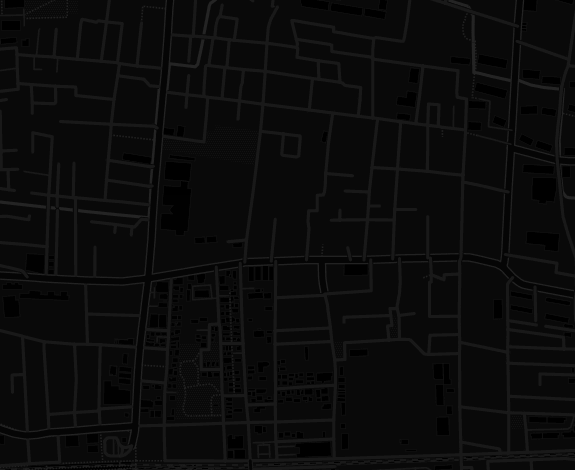

In [ ]:
cv2_imshow(cv2_image)

In [ ]:
def gradient(img):
    kernel = np.ones((5, 5), np.uint8)
    imgf = cv2.morphologyEx(img, cv2.MORPH_GRADIENT, kernel)
    return imgf

def erosion(img):
    kernel = np.ones((3, 3), np.uint8)
    imgf = cv2.erode(img, kernel, iterations=1)
    return imgf

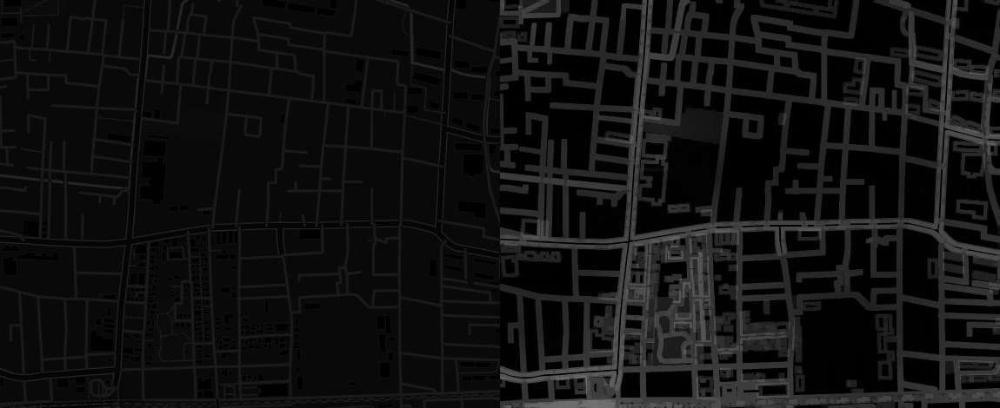

In [ ]:
# cv2_image_copy = cv2.bitwise_not(cv2_image)
cv2_image_copy = cv2_image.copy()
# cv2_image_copy = gradient(cv2_image_copy)
# cv2_image_copy = erosion(cv2_image_copy)

lab = cv2.cvtColor(cv2_image_copy, cv2.COLOR_BGR2LAB)
l_channel, a, b = cv2.split(lab)

clahe = cv2.createCLAHE(clipLimit=15.0, tileGridSize=(8, 8))
cl = clahe.apply(l_channel)

limg = cv2.merge((cl, a, b))

enhanced_img = cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)
enhanced_img = gradient(enhanced_img)

result = np.hstack((cv2_image, enhanced_img))
cv2_imshow(result)

In [ ]:
edges = cv2.Canny(enhanced_img, 50, 150)
cv2.imwrite("road_outline.png", edges)

True

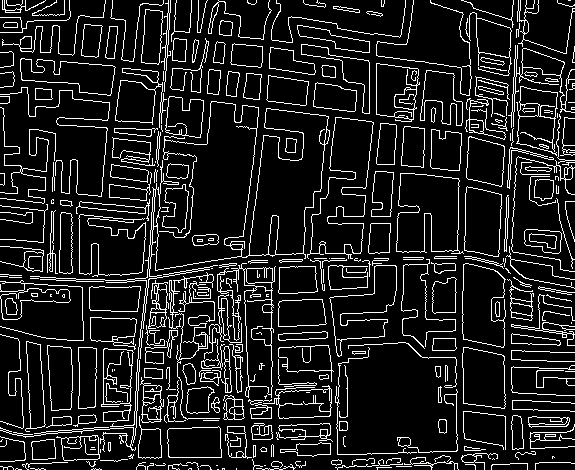

In [ ]:
cv2_imshow(edges)